In [ ]:
#Exercise 1
#The forward euler algorithm applied to the bubble chamber

import numpy as np
import matplotlib.pyplot as plt
import numpy.random as rd

def cloud_chamber_euler (x_0, v_0, m, q, gamma, B, dt, n_steps):
  '''
  It uses the forward Euelr algorithm to generate solutions to the differential
  equations governing the motion of particles ina  bubble chamber.
  It takes as keyword arguments:
  x_o: a numpy array of shape (3,) representing the initial position
  v_o: a NumPy array of shape (3,)representing the inital velocity which is 
  given as a fraction of the speed of light.
  m: a float represintg the mass of the particle
  q: an int representin the charge of the particle
  gamma: a float representing the damping coefficient
  B: a numpy array of shape (3,) representing the value of the magnetic field
  dt: a float, the timestep for the iterations
  n_steps: an int, the number of iteration for the algorithm

  An array of time coordinates is created, through which the iterations will
  take place. The first and second value of the positiona and velocity coordinate
  is calculated. The algorithm is then started in a for loop, where at each iteration
  the acceleration and velocity is computed and the repsecitve position and 
  velocity coordinate is appended. The function returns the x, y and z coordinates
  of the particle in the bubble chamber.
  '''

  t = np.linspace(0, 5, n_steps)
  x = np.zeros(shape = np.shape(t)) 
  y = np.zeros(shape = np.shape(t)) 
  z = np.zeros(shape = np.shape(t)) 
  x[0] = x_0[0]
  x[1] = x_0[0] + v_0[0]*dt
  y[0] = x_0[1]
  y[1] = x_0[1] + v_0[1]*dt
  z[0] = x_0[2]
  z[1] = x_0[2] +  v_0[2]*dt
  for i in range(len(t) - 2):
    vel = np.zeros((3,))
    vel[0] = (x[i+1]- x[i])/dt
    vel[1] = (y[i+1]- y[i])/dt
    vel[2] = (z[i+1]- z[i])/dt
    cross = np.cross(vel, B)
    a_x = q/m*cross[0] - gamma/m*vel[0]
    a_y = q/m*cross[1] - gamma/m*vel[1]
    a_z = q/m*cross[2] - gamma/m*vel[2]
    x[i + 2] = a_x*dt*dt + 2*(x[i + 1]) - x[i]
    y[i + 2] = a_y*dt*dt + 2*(y[i + 1]) - y[i]
    z[i + 2] = a_z*dt*dt + 2*(z[i + 1]) - z[i]
  return x, y, z  

In [ ]:
#The 4th order Runge-Kutta algorithm applied to the bubble chamber

import numpy as np
import matplotlib.pyplot as plt
import numpy.random as rd
import matplotlib.animation as animation

def cloud_chamber_runge_kutta (x_0, v_0, m, q, gamma, B, dt, n_steps):
  '''
  It uses the 4th order Runge-Kutta algorithm to compute the solutions to 
  the ODE describing the behaviour of particles ina  bubble chamber.
  It takes as keyword arguments:
  x_o: a numpy array of shape (3,) representing the initial position
  v_o: a NumPy array of shape (3,)representing the inital velocity which is 
  given as a fraction of the speed of light.
  m: a float represintg the mass of the particle
  q: an int representin the charge of the particle
  gamma: a float representing the damping coefficient
  B: a numpy array of shape (3,) representing the value of the magnetic field
  dt: a float, the timestep for the iterations
  n_steps: an int, the number of iteration for the algorithm
  The Runge-Kutta algorithm is iterated over the timespan 0 < t < 10 seconds. At
  each iteration the respective accelerations are calculated (the F terms) and
  at the end the weighted average of them is taken. The new position and velocity
  coordinates are computed and appended to a different list.
  The function returns the x and y components of the particles.
  '''

  t = np.linspace(0, 10, n_steps)
  x = np.zeros((len(t), 3))
  v = np.zeros((len(t), 3))
  x[0] = x_0
  v[0] = v_0
  fun_1 = lambda k: k
  fun_2 = lambda vel: q/m*np.cross(vel, B) - gamma/m*vel
  x_comp = []
  y_comp = []
  for i in range(len(t)-1):
    F_1_x = fun_1(v[i])
    F_1_v = fun_2(v[i])
    F_2_x = fun_1( v[i] + dt*F_1_v/2)
    F_2_v = fun_2( v[i] + dt*F_1_v/2)
    F_3_x = fun_1( v[i] + dt*F_2_v/2)
    F_3_v = fun_2(v[i] + dt*F_2_v/2)
    F_4_x = fun_1( v[i] + dt*F_3_v)
    F_4_v = fun_2( v[i] + dt*F_3_v)
    x[i + 1] = x[i] + dt/6*(F_1_x + 2*F_2_x + 2*F_3_x + F_4_x)
    v[i + 1] = v[i] + dt/6*(F_1_v + 2*F_2_v + 2*F_3_v + F_4_v)
    x_comp.append(x[i][0])
    y_comp.append(x[i][1])
  return x_comp, y_comp

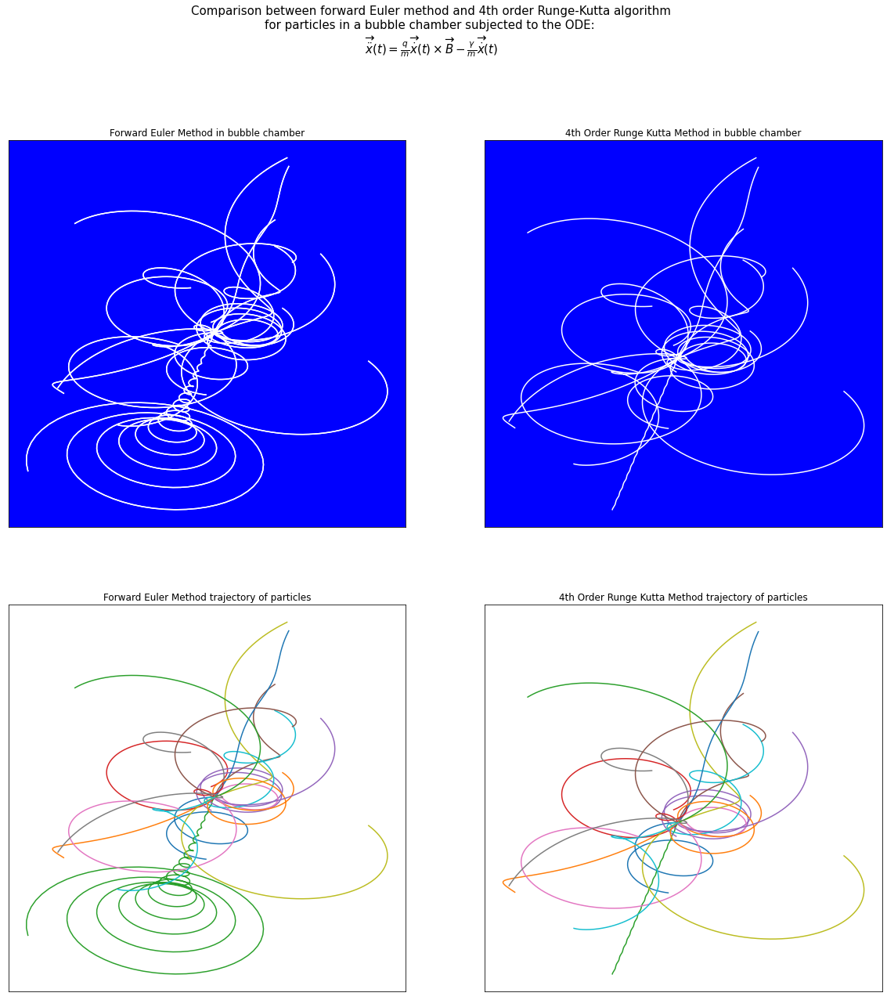

In [ ]:
#Plots of the algorithm solutions (It requires first two cells to be executed first)

#Defining the arguments for the plots

rd.seed(9)
x_0 = [0, 0, 0]
v_0 = rd.uniform(-1, 1, size = (20, 3))
gamma = 0.001
B = rd.uniform(-2, 3, size = (3,))
masses = rd.uniform(0.0001, 10, size = (20,))
charge = rd.choice((-1, 1), size = (20,) )
dt = 0.01
n_steps = 1000

#Marking the subplots, the axis are set and 20 particles trajectory are drawn
fig, ax = plt.subplots(nrows = 2, ncols = 2, figsize = (20, 20))
fig.suptitle('Comparison between forward Euler method and 4th order Runge-Kutta algorithm\n\
for particles in a bubble chamber subjected to the ODE: \n' + \
r'$\overrightarrow{\ddot{x}}(t)=\frac{q}{m}\overrightarrow{\dot{x}}(t)\times\overrightarrow{B}\
-\frac{\gamma}{m}\overrightarrow{\dot{x}}(t)$', y= 1, fontsize = 15, va = 'top')


for i in range(20):
  euler = cloud_chamber_euler (x_0, v_0[i], masses[i], charge[i], gamma, B, dt, n_steps)
  r_k   = cloud_chamber_runge_kutta (x_0, v_0[i], masses[i], charge[i], gamma, B, dt, n_steps)
  ax[0][0].plot(euler[0], euler[1], c = 'white')
  ax[0][1].plot(r_k[0], r_k[1], c = 'white')
  ax[0][0].set_title('Forward Euler Method in bubble chamber')
  ax[0][1].set_title('4th Order Runge Kutta Method in bubble chamber')
  ax[1][0].set_title('Forward Euler Method trajectory of particles')
  ax[1][1].set_title('4th Order Runge Kutta Method trajectory of particles')
  ax[0][0].plot(euler[0], euler[1], c = 'white')
  ax[0][0].set_facecolor('blue')
  ax[0][1].set_facecolor('blue')
  ax[1][0].plot(euler[0], euler[1])
  ax[1][1].plot(r_k[0], r_k[1])
for i, ax in enumerate(ax.flatten()):
  ax.axes.xaxis.set_visible(False)
  ax.axes.yaxis.set_visible(False)

plt.show()
  

In [ ]:
#Exercise 2 Timing (it requires cell 2 to be executed first)
'''
The attributes -q and -o allow to quiet the %timeit output and store it in a 
variable for later usage.
'''

#Setting arguments for algorithms

v_0 = rd.uniform(-1, 1, size = (3,))
B = rd.uniform(-2, 3, size = (3,))
masses = rd.uniform(0.0001, 10)
charge = rd.choice((-1, 1))
e = 'Euler method'
rk = 'Runge-Kutta algorithm'

time_euler = %timeit -q -o cloud_chamber_euler(x_0, v_0, masses, charge, gamma, B, dt, n_steps)
time_rk = %timeit -q -o cloud_chamber_runge_kutta(x_0, v_0, masses, charge, gamma, B, dt, n_steps)


print(f'The time taken for the Euler method is {time_euler.best} seconds.\n\
The time taken for the 4th order Runge-Kutta algorithm is {time_rk.best} seconds.')

if time_euler.best < time_rk.best:
  print("The {} is {}% faster than the {}" .format(e, time_euler.best/time_rk.best*100,rk))
else:
 print("The {} is {}% faster than the {}" .format(rk, time_rk.best/time_euler.best*100,e))

The time taken for the Euler method is 0.054468456799986596 seconds.
The time taken for the 4th order Runge-Kutta algorithm is 0.2003622579995863 seconds.
The Euler method is 27.184988502225337% faster than the Runge-Kutta algorithm


We decided to solve the first problem with two different methods: Euler's method and Runge-Kutta method. 
The problem asked for a solution of a second order differential equation, both methods work as numerical approximations and with starting values.
We wrote a function to evaluate each method and then plotted the results.
Euler's method is the most straightforward and easy to compute, but has a bigger error (the global is equal to each step dt) so less accurate. The forward-euler algorithm bascially consists in first discretizing the differential equation governing the motion of the particles in the bubble chamber, i.e. $$m\overrightarrow{\ddot{x}}(t)=q\overrightarrow{\dot{x}}(t)\times\overrightarrow{B}-\gamma\overrightarrow{\dot{x}}(t)$$
The first step of the code is to assign the inital values of the positions and velocities to empty arrays to which the subsequent values will be appended. Also, the second value of both the position and velocity of the particle is calculated through the discretization. The real algorithm starts now, when a for loop is created, running from the coordinates of positions and velocity at time steps 3 (because we already computed the first and second values). The code is stunningly simple: at each iteration the acceleration is computed by relating to the inital differential equation, that is: $$\overrightarrow{\ddot{x}}(t)=\frac{q}{m}\overrightarrow{\dot{x}}(t)\times\overrightarrow{B}-\frac{\gamma}{m}\overrightarrow{\dot{x}}(t)$$ and the next value is calculated (always thanks to the discretization of the equation) as $$x[i+2]=\overrightarrow{\ddot{x}}(t)\cdot dt\cdot dt+2\cdot(x[i+1])-x[i]$$ 
Intuitively, the algorithm is relying on how the function will change when a small step forward (the dt in our code) is made. In most of the cases, the function will be well approximated by the tangent approximation of the curve at that point. By using this assumption the algorithm is repeated, and nice results are obtained. Mathematically speaking, the forward Euler method is a reminiscent of a Taylor series expansion truncated at the third term, meaning the error of truncation is defined as (using big O notation):  $$O(h^{3})$$
As one may expect from this, having this type of error does not lead to a very accurate result, because frequent rounding steps are made and in case of oscillating solutions (or stiff equations) the algorithm fails. This is why more advanced schemes have been created, such as the 4th order Runge-Kutta method, which we have implemented as a comparison to the forward Euler method. 

The Runge-Kutta method is used to solve differential equations by using two starting values inside a system. This is a more complete and accurate version of the Euler's method (that actually is the first passage of the method itself).
The process is divided in four steps that are basically the corresponding value plus the weighted average of the previous steps. The steps with more weight are the second and the third. Once again our dt that is given.  This method is of fourth order, thus has a local truncation error of O(h5) and a total error of O(h4). Notice how the error of the Euler’s method is of O(h3) and thus a bit less accurate. 
It is important to notice that the starting equation of the problem was a second order differential, so we had to first write it in terms of first order differential and then apply the method two times.
The whole algorithm overall looks very similar to the one we wrote for the Euler’s method, but in this case after defining the graph we had to define two functions and of course a different for loop.
For both the functions we used a lambda: the first one just gives back the value, while the second one is our real function: 
$$\frac{d\overrightarrow{v}}{dt}=\frac{q}{m}\overrightarrow{v}(t)\times\overrightarrow{B}-\frac{\gamma}{m}\overrightarrow{v}(t)$$
We also had to define x and y components for the graph that will be used later.
Now start the important part, that once again we solved with a for loop that contains the expansion of the Runge-Kutta method:
$$F_{-}1_{-}x=fun(v[i])$$
$$F_{-}2_{-}x=fun(v[i]+dt\frac{F_{-}1_{-}v}{2})$$
$$F_{-}3_{-}x=fun(v[i]+dt\frac{F_{-}2_{-}v}{2})$$
$$F_{-}4_{-}x=fun(v[i]+dt\cdot F_{-}3_{-}v)$$
$$ x[i+1]=x[i]+\frac{dt}{6}(F_{1}{}_{x}+2F_{2}{}_{x}+F_{3}{}_{x}+F_{4}{}_{x})$$
The same process was computed for v, the F_n_v that appear in this expansion exactly from that. This double expansion was necessary because the method works only for first order differential equations, and ours was of second order. Therefore we rewrote the ODE as a system of first order differential equations.
Before closing the function we appended the newly found values at x _comp and y_comp.
The last part of the code is when we actually used and plotted the function, defining each argument and then using a for loop again. 
In conclusion, as can also be seen from the previous plots, the Runge-Kutta method appears to be more stable and solid whne dealing with particles that undergo rapid rotations (or spirals). This is a sign that the Runge-Kutta algorithm deals with oscillating solution (and stiffness of the equation) better than the Euler method.


In [ ]:
'''
A try has been made to also create an aniamtion of the particles trajectory.
Alert! The time required for the code to run is around 3 to 5 minutes.
'''
rd.seed(9)

import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation, rc
from IPython.display import HTML


#Marking the figure on which the animation is displayed
fig, ax = plt.subplots(figsize = (8,8))
plt.close()

x_0 = [0, 0, 0]
v_0 = rd.uniform(-1, 1, size = (5,3))
m = 1
q = 1
gamma = 0.001
B = rd.uniform(-2, 3, size = (3,))
masses = rd.uniform(0.0001, 10, size = (5,))
charge = rd.choice((-1, 1), size = (5,) )
dt = 0.01
n_steps = 500

#Setting the functions to plot
x = lambda i: cloud_chamber_euler(x_0, v_0[i], masses[i], charge[i], gamma, B, dt, n_steps)[0]
y = lambda i: cloud_chamber_euler(x_0, v_0[i], masses[i], charge[i], gamma, B, dt, n_steps)[1]

ax.set_xlim(( -4, 4))
ax.set_ylim((-4, 4))
ax.axes.xaxis.set_visible(False)
ax.axes.yaxis.set_visible(False)
ax.set_facecolor('blue')
#Creating the line animation to be displayed

line1, = ax.plot([], [], lw=2)
line2, = ax.plot([], [], lw=2)
line3, = ax.plot([], [], lw=2)
line4, = ax.plot([], [], lw=2)
line5, = ax.plot([], [], lw=2)

#the initialization function plots the background of each frame
def init():
      line1.set_data([], [])
      line2.set_data([], [])
      line3.set_data([], [])
      line4.set_data([], [])
      line5.set_data([], [])
      return line1 , line2, line3, line4, line5

#the animation functions. It recursevely calls the inside while plotting.
def animate_euler(i):
      line1.set_data(x(0)[0:i], y(0)[0:i])
      line2.set_data(x(1)[0:i],y(1)[0:i])
      line3.set_data(x(2)[0:i], y(2)[0:i])
      line4.set_data(x(3)[0:i], y(3)[0:i])
      line5.set_data(x(4)[0:i], y(4)[0:i])
      return line1 , line2, line3, line4, line5
    

anim = animation.FuncAnimation(fig, animate_euler, init_func=init,
                              frames = 500, interval = 20, blit=True)

#This part is required for the animation to run in Google Colab
rc('animation', html='jshtml')
anim